In [ ]:
!pip install -q captum kaggle

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.2/455.2 kB 14.9 MB/s eta 0:00:00


In [ ]:
import json

import json

kaggle_token = {
    "username": "sri20006",
    "key": "KGAT_b1714ff67f82036c54b82256c8c1788e"
}

with open("kaggle.json", "w") as f:
    json.dump(kaggle_token, f)

print("kaggle.json created successfully!")
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d paultimothymooney/chest-xray-pneumonia -q
!unzip -qo chest-xray-pneumonia.zip
!ls chest_xray

kaggle.json created successfully!
Dataset URL: https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia
License(s): other
chest_xray  __MACOSX  test  train  val


In [ ]:
import os, time, copy, json, warnings
warnings.filterwarnings("ignore")

import numpy as np
import cv2
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from IPython.display import display, Image as IPImage

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, WeightedRandomSampler
from torch.optim.lr_scheduler import OneCycleLR
from torchvision import datasets, transforms, models

from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, roc_auc_score, confusion_matrix,
    ConfusionMatrixDisplay, RocCurveDisplay,
)
from tqdm.auto import tqdm
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

class SafeImageFolder(datasets.ImageFolder):
    def __getitem__(self, index):
        while True:
            try:
                return super().__getitem__(index)
            except Exception as e:
                print(f"Skipping corrupted image: {self.samples[index][0]}")
                index = (index + 1) % len(self.samples)

In [ ]:
CFG = dict(
    # ── Paths ────────────────────────────────────────────────────────────────
    DATA_ROOT    = "chest_xray",          # change if your unzip path differs
    CKPT_DIR     = "checkpoints",
    RESULTS_DIR  = "results",

    # ── Training ─────────────────────────────────────────────────────────────
    IMAGE_SIZE   = 224,
    BATCH_SIZE   = 32,
    NUM_WORKERS  = 2,
    EPOCHS       = 20,
    LR           = 3e-4,
    WEIGHT_DECAY = 1e-4,
    FREEZE_EPOCHS= 4,          # epochs to train only the head (backbone frozen)
    PATIENCE     = 6,          # early-stopping patience (val AUC)
    LABEL_SMOOTH = 0.05,

    # ── XAI ──────────────────────────────────────────────────────────────────
    N_XAI_SAMPLES = 8,         # test images to visualise per model
    N_COMPARE     = 4,         # images for cross-model comparison grid

    # ── ImageNet normalisation stats ──────────────────────────────────────────
    MEAN = [0.485, 0.456, 0.406],
    STD  = [0.229, 0.224, 0.225],
)

CLASS_NAMES = ["NORMAL", "PNEUMONIA"]



In [ ]:
def get_device():
    if torch.cuda.is_available():
        dev = torch.device("cuda")
    elif torch.backends.mps.is_available():
        dev = torch.device("mps")
    else:
        dev = torch.device("cpu")
    print(f"✅ Device: {dev}"
          + (f"  ({torch.cuda.get_device_name(0)})" if dev.type == "cuda" else ""))
    return dev
DEVICE = get_device()

✅ Device: cuda  (Tesla T4)


In [ ]:
def get_transforms(train: bool) -> transforms.Compose:
    sz = CFG["IMAGE_SIZE"]
    if train:
        return transforms.Compose([
            transforms.Resize((sz + 32, sz + 32)),
            transforms.RandomResizedCrop(sz, scale=(0.75, 1.0)),
            transforms.RandomHorizontalFlip(),
            transforms.RandomRotation(12),
            transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.1),
            transforms.ToTensor(),
            transforms.Normalize(CFG["MEAN"], CFG["STD"]),
        ])
    return transforms.Compose([
        transforms.Resize((sz, sz)),
        transforms.ToTensor(),
        transforms.Normalize(CFG["MEAN"], CFG["STD"]),
    ])


def make_balanced_sampler(dataset):
    targets       = np.array(dataset.targets)
    _, counts     = np.unique(targets, return_counts=True)
    class_weights = 1.0 / counts.astype(float)
    sample_weights = class_weights[targets]
    return WeightedRandomSampler(
        torch.from_numpy(sample_weights).float(),
        num_samples = len(sample_weights),
        replacement = True,
    )


def build_loaders():
    root = CFG["DATA_ROOT"]
    for split in ("train", "val", "test"):
        p = os.path.join(root, split)
        if not os.path.isdir(p):
            raise FileNotFoundError(
                f"❌  Directory not found: {p}\n"
                "    Make sure chest_xray/ has train/, val/, test/ sub-folders."
            )

    train_ds = SafeImageFolder(os.path.join(root, "train"), get_transforms(True))
    val_ds   = SafeImageFolder(os.path.join(root, "val"),   get_transforms(False))
    test_ds  = SafeImageFolder(os.path.join(root, "test"),  get_transforms(False))

    nw = 0
    print("Number of workers:", nw)
    pin = DEVICE.type == "cuda"

    train_loader = DataLoader(train_ds, batch_size=CFG["BATCH_SIZE"],
                              sampler=make_balanced_sampler(train_ds),
                              num_workers=nw, pin_memory=pin, drop_last=True)
    val_loader   = DataLoader(val_ds,   batch_size=CFG["BATCH_SIZE"],
                              shuffle=False, num_workers=nw, pin_memory=pin)
    test_loader  = DataLoader(test_ds,  batch_size=CFG["BATCH_SIZE"],
                              shuffle=False, num_workers=nw, pin_memory=pin)

    print(f"📂 Dataset  train={len(train_ds)}  val={len(val_ds)}  test={len(test_ds)}")
    return {"train": train_loader, "val": val_loader, "test": test_loader,
            "ds": {"train": train_ds, "val": val_ds, "test": test_ds}}



In [ ]:
loaders = build_loaders()

Number of workers: 0
📂 Dataset  train=5216  val=16  test=624


In [ ]:
def build_resnet50(num_classes=2, freeze=False):
    model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
    if freeze:
        for p in model.parameters():
            p.requires_grad = False
    model.fc = nn.Sequential(nn.Dropout(0.4), nn.Linear(model.fc.in_features, num_classes))
    model.name = "resnet50"
    model.model_label = "ResNet-50"
    return model


def build_efficientnet(num_classes=2, freeze=False):
    model = models.efficientnet_b3(weights=models.EfficientNet_B3_Weights.IMAGENET1K_V1)
    if freeze:
        for p in model.parameters():
            p.requires_grad = False
    in_f = model.classifier[1].in_features
    model.classifier = nn.Sequential(nn.Dropout(0.4), nn.Linear(in_f, num_classes))
    model.name = "efficientnet"
    model.model_label = "EfficientNet-B3"
    return model


def get_model(name: str, freeze=False):
    builders = {"resnet50": build_resnet50, "efficientnet": build_efficientnet}
    if name not in builders:
        raise ValueError(f"Unknown model: {name}")
    model = builders[name](freeze=freeze).to(DEVICE)
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"🔧 {model.model_label}  trainable params: {trainable:,}")
    return model


def get_target_layer(model):
    """Last conv block — used by Grad-CAM."""
    if model.name == "resnet50":
        return model.layer4[-1]
    elif model.name == "efficientnet":
        return model.features[-1][0]
    raise ValueError(f"No target layer mapping for {model.name}")



In [ ]:
def run_epoch(model, loader, criterion, optimizer, scheduler, is_train):
    model.train(is_train)
    running_loss = 0.0
    all_preds, all_probs, all_labels = [], [], []

    with torch.set_grad_enabled(is_train):
        for imgs, labels in tqdm(loader, leave=False,
                                 desc="  train" if is_train else "  eval "):
            imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
            logits = model(imgs)
            loss   = criterion(logits, labels)

            if is_train:
                optimizer.zero_grad()
                loss.backward()
                nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
                if scheduler: scheduler.step()

            probs = torch.softmax(logits, dim=1)[:, 1]
            preds = logits.argmax(dim=1)
            running_loss += loss.item() * imgs.size(0)
            all_preds.extend(preds.cpu().numpy())
            all_probs.extend(probs.detach().cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    n   = len(all_labels)
    acc = accuracy_score(all_labels, all_preds)
    try:
        auc = roc_auc_score(all_labels, all_probs)
    except ValueError:
        auc = 0.5
    return {"loss": running_loss / n, "accuracy": acc, "auc": auc,
            "preds": all_preds, "probs": all_probs, "labels": all_labels}


def train_model(model, loaders):
    os.makedirs(CFG["CKPT_DIR"], exist_ok=True)
    criterion  = nn.CrossEntropyLoss(label_smoothing=CFG["LABEL_SMOOTH"])
    name       = model.name
    label      = model.model_label

    def make_opt():
        return optim.AdamW(
            [p for p in model.parameters() if p.requires_grad],
            lr=CFG["LR"], weight_decay=CFG["WEIGHT_DECAY"]
        )

    optimizer = make_opt()
    steps     = len(loaders["train"])
    scheduler = OneCycleLR(optimizer, max_lr=CFG["LR"],
                           total_steps=CFG["EPOCHS"] * steps,
                           pct_start=0.1, anneal_strategy="cos")

    best_auc, best_state, patience_ct = 0.0, None, 0
    history = {"train": [], "val": []}

    print(f"\n{'═'*60}")
    print(f"  Training {label}")
    print(f"{'═'*60}")

    for epoch in range(1, CFG["EPOCHS"] + 1):
        t0 = time.time()

        # Unfreeze backbone after freeze_epochs
        if epoch == CFG["FREEZE_EPOCHS"] + 1:
            print(f"\n  🔓 Epoch {epoch}: Unfreezing backbone …")
            for p in model.parameters():
                p.requires_grad = True
            optimizer = make_opt()
            remaining = (CFG["EPOCHS"] - epoch + 1) * steps
            scheduler = OneCycleLR(optimizer, max_lr=CFG["LR"] / 5,
                                   total_steps=max(remaining, 1),
                                   pct_start=0.05, anneal_strategy="cos")

        tr = run_epoch(model, loaders["train"], criterion, optimizer, scheduler, True)
        vl = run_epoch(model, loaders["val"],   criterion, None,      None,      False)
        history["train"].append(tr)
        history["val"].append(vl)

        elapsed = time.time() - t0
        print(f"  Ep {epoch:02d}/{CFG['EPOCHS']}  "
              f"loss {tr['loss']:.3f}→{vl['loss']:.3f}  "
              f"acc {tr['accuracy']:.3f}→{vl['accuracy']:.3f}  "
              f"auc {vl['auc']:.4f}  ({elapsed:.0f}s)")

        if vl["auc"] > best_auc + 1e-4:
            best_auc   = vl["auc"]
            best_state = copy.deepcopy(model.state_dict())
            patience_ct = 0
            torch.save({"state_dict": best_state, "auc": best_auc},
                       os.path.join(CFG["CKPT_DIR"], f"{name}_best.pt"))
            print(f"  ✅ New best AUC {best_auc:.4f} — checkpoint saved")
        else:
            patience_ct += 1
            if patience_ct >= CFG["PATIENCE"]:
                print(f"  ⏹  Early stop at epoch {epoch}")
                break

    model.load_state_dict(best_state)
    print(f"\n  🏁 {label} — best val AUC = {best_auc:.4f}")
    return model, history


def plot_training_history(histories: dict, out_dir: str):
    """Plot loss and AUC curves for both models side by side."""
    os.makedirs(out_dir, exist_ok=True)
    fig, axes = plt.subplots(2, 2, figsize=(13, 8))
    palette   = {"resnet50": "#2E86AB", "efficientnet": "#F18F01"}
    titles    = {"resnet50": "ResNet-50", "efficientnet": "EfficientNet-B3"}

    for name, history in histories.items():
        color = palette[name]
        label = titles[name]
        epochs = range(1, len(history["train"]) + 1)
        tr_loss = [m["loss"]     for m in history["train"]]
        vl_loss = [m["loss"]     for m in history["val"]]
        tr_auc  = [m["auc"]      for m in history["train"]]
        vl_auc  = [m["auc"]      for m in history["val"]]

        # Loss
        axes[0, 0].plot(epochs, tr_loss, label=f"{label} train", color=color)
        axes[0, 0].plot(epochs, vl_loss, label=f"{label} val",   color=color, ls="--")
        # AUC
        axes[0, 1].plot(epochs, tr_auc,  label=f"{label} train", color=color)
        axes[0, 1].plot(epochs, vl_auc,  label=f"{label} val",   color=color, ls="--")

    for ax, title in zip(axes[0], ["Training & Validation Loss", "Training & Validation AUC"]):
        ax.set_xlabel("Epoch"); ax.set_title(title); ax.legend(fontsize=8); ax.grid(alpha=0.3)

    # Hide unused subplots
    axes[1, 0].axis("off"); axes[1, 1].axis("off")
    plt.suptitle("Training History", fontsize=13)
    plt.tight_layout()
    path = os.path.join(out_dir, "training_history.png")
    plt.savefig(path, dpi=150, bbox_inches="tight")
    plt.close()
    print(f"  📊 Training history → {path}")
    return path


In [ ]:
def _norm(a: np.ndarray) -> np.ndarray:
    mn, mx = a.min(), a.max()
    return np.zeros_like(a, dtype=np.float32) if mx - mn < 1e-8 \
           else ((a - mn) / (mx - mn)).astype(np.float32)

def _to_batch(t: torch.Tensor) -> torch.Tensor:
    return (t.unsqueeze(0) if t.dim() == 3 else t).float()

def _resize(a: np.ndarray, h: int, w: int) -> np.ndarray:
    return cv2.resize(a.astype(np.float32), (w, h), interpolation=cv2.INTER_LINEAR)



In [ ]:
# ── 1. Grad-CAM ───────────────────────────────────────────────────────────────
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self._fmap = self._grad = None
        self._fh = target_layer.register_forward_hook(
            lambda m, i, o: setattr(self, "_fmap", o.detach()))
        self._bh = target_layer.register_full_backward_hook(
            lambda m, gi, go: setattr(self, "_grad", go[0].detach()))

    def generate(self, img_t, target_class=None):
        inp = _to_batch(img_t).requires_grad_(True)
        self.model.eval(); self.model.zero_grad()
        logits = self.model(inp)
        tc = target_class if target_class is not None else int(logits.argmax(1).item())
        logits[0, tc].backward()
        weights = self._grad.mean(dim=(2, 3), keepdim=True)
        cam = F.relu((weights * self._fmap).sum(dim=1).squeeze()).cpu().numpy()
        return _norm(_resize(cam, inp.shape[2], inp.shape[3])), tc

    def remove(self):
        self._fh.remove(); self._bh.remove()


# ── 2. Guided Backprop (used inside Guided Grad-CAM) ─────────────────────────
class GuidedBackprop:
    def __init__(self, model):
        self.model = model
        self._hooks = []
        for m in model.modules():
            if isinstance(m, nn.ReLU):
                self._hooks.append(
                    m.register_backward_hook(
                        lambda mod, gi, go: (torch.clamp(gi[0], min=0.0),)
                    )
                )

    def generate(self, img_t, target_class=None):
        inp = _to_batch(img_t).requires_grad_(True)
        inp.retain_grad()
        self.model.eval(); self.model.zero_grad()
        logits = self.model(inp)
        tc = target_class if target_class is not None else int(logits.argmax(1).item())
        logits[0, tc].backward()
        gb = inp.grad.data[0].cpu().numpy()
        return _norm(np.maximum(gb, 0).mean(axis=0))

    def remove(self):
        for h in self._hooks: h.remove()


# ── 3. Guided Grad-CAM ────────────────────────────────────────────────────────
def guided_gradcam(model, target_layer, img_t, target_class=None):
    gc  = GradCAM(model, target_layer)
    gbp = GuidedBackprop(model)
    cam, tc = gc.generate(img_t, target_class)
    gb      = gbp.generate(img_t, tc)
    gc.remove(); gbp.remove()
    return _norm(cam * gb), tc


# ── 4. Integrated Gradients ───────────────────────────────────────────────────
def integrated_gradients(model, img_t, target_class=None, n_steps=50):
    inp      = _to_batch(img_t)
    baseline = torch.zeros_like(inp)
    model.eval()
    tc = target_class
    if tc is None:
        with torch.no_grad():
            tc = int(model(inp).argmax(1).item())

    if CAPTUM_OK:
        ig   = CaptumIG(model)
        attr = ig.attribute(inp, baselines=baseline, target=tc,
                            n_steps=n_steps, internal_batch_size=1)
        attr_np = attr[0].detach().cpu().numpy()
    else:
        alphas  = torch.linspace(0, 1, n_steps)
        grads   = []
        for a in alphas:
            interp = (baseline + a * (inp - baseline)).requires_grad_(True)
            logits = model(interp)
            model.zero_grad()
            logits[0, tc].backward()
            grads.append(interp.grad.detach().clone())
        avg_g   = torch.stack(grads).mean(0)
        attr_np = ((inp - baseline) * avg_g)[0].cpu().numpy()

    return _norm(np.linalg.norm(attr_np, axis=0)), tc


# ── 5. Saliency Map (SmoothGrad) ──────────────────────────────────────────────
def saliency_map(model, img_t, target_class=None, n_smooth=20, sigma=0.1):
    model.eval()
    inp = _to_batch(img_t)
    tc  = target_class
    if tc is None:
        with torch.no_grad():
            tc = int(model(inp).argmax(1).item())
    noise_level = sigma * (inp.max() - inp.min()).item()
    sal_sum = np.zeros(inp.shape[2:], dtype=np.float64)
    for _ in range(n_smooth):
        noisy = (inp + torch.randn_like(inp) * noise_level).requires_grad_(True)
        model.zero_grad()
        model(noisy)[0, tc].backward()
        sal_sum += noisy.grad.data[0].abs().cpu().numpy().max(axis=0)
    return _norm(sal_sum / n_smooth), tc


# ── unified dispatcher ────────────────────────────────────────────────────────
def explain(method, model, img_t, target_layer=None, target_class=None):
    """
    Returns (heatmap [H,W], predicted_class_index).
    method: 'gradcam' | 'guided_gradcam' | 'ig' | 'saliency'
    """
    m = method.lower()
    if m == "gradcam":
        gc = GradCAM(model, target_layer)
        hm, tc = gc.generate(img_t, target_class)
        gc.remove()
        return hm, tc
    elif m == "guided_gradcam":
        return guided_gradcam(model, target_layer, img_t, target_class)
    elif m == "ig":
        return integrated_gradients(model, img_t, target_class)
    elif m == "saliency":
        return saliency_map(model, img_t, target_class)
    else:
        raise ValueError(f"Unknown method: {method}")


In [ ]:
# SECTION 8 ── EVALUATION
# ═════════════════════════════════════════════════════════════════════════════

@torch.no_grad()
def collect_predictions(model, loader):
    model.eval()
    labels_all, preds_all, probs_all = [], [], []
    for imgs, labels in tqdm(loader, desc="  inference", leave=False):
        imgs    = imgs.to(DEVICE)
        logits  = model(imgs)
        probs   = torch.softmax(logits, 1)[:, 1].cpu().numpy()
        preds   = logits.argmax(1).cpu().numpy()
        labels_all.extend(labels.numpy())
        preds_all.extend(preds)
        probs_all.extend(probs)
    return (np.array(labels_all), np.array(preds_all), np.array(probs_all))


def compute_metrics(labels, preds, probs):
    return {
        "accuracy" : float(accuracy_score(labels, preds)),
        "precision": float(precision_score(labels, preds, zero_division=0)),
        "recall"   : float(recall_score(labels, preds, zero_division=0)),
        "f1"       : float(f1_score(labels, preds, zero_division=0)),
        "roc_auc"  : float(roc_auc_score(labels, probs)),
    }


def print_metrics(name, metrics):
    print(f"\n  {'─'*40}")
    print(f"  {name} — Test-Set Metrics")
    print(f"  {'─'*40}")
    for k, v in metrics.items():
        bar = "█" * int(v * 20) + "░" * (20 - int(v * 20))
        print(f"  {k:<12} {bar}  {v:.4f}")
    print(f"  {'─'*40}")



In [ ]:
# SECTION 9 ── VISUALISATION HELPERS
# ═════════════════════════════════════════════════════════════════════════════
MEAN_T = np.array([0.485, 0.456, 0.406]).reshape(3, 1, 1)
STD_T  = np.array([0.229, 0.224, 0.225]).reshape(3, 1, 1)

def tensor_to_rgb(t: torch.Tensor) -> np.ndarray:
    img = (t.cpu().numpy() * STD_T + MEAN_T).clip(0, 1)
    return (img.transpose(1, 2, 0) * 255).astype(np.uint8)

def overlay(img_rgb: np.ndarray, hm: np.ndarray, alpha=0.45) -> np.ndarray:
    h, w  = img_rgb.shape[:2]
    hm_r  = cv2.resize(hm, (w, h))
    hm_u8 = (hm_r * 255).astype(np.uint8)
    hm_c  = cv2.applyColorMap(hm_u8, cv2.COLORMAP_JET)
    hm_c  = cv2.cvtColor(hm_c, cv2.COLOR_BGR2RGB)
    return cv2.addWeighted(img_rgb, 1 - alpha, hm_c, alpha, 0)

def show_inline(path):
    """Display a saved PNG inside Colab."""
    try:
        display(IPImage(path))
    except Exception:
        pass

In [ ]:
# SECTION 10 ── PER-MODEL XAI GRID  (1 image × 5 columns)
# ═════════════════════════════════════════════════════════════════════════════
XAI_METHODS = [
    ("Grad-CAM",         "gradcam"),
    ("Guided Grad-CAM",  "guided_gradcam"),
    ("Integrated Grads", "ig"),
    ("Saliency Map",     "saliency"),
]


def plot_xai_sample(model, target_layer, img_t, true_label, out_path):
    """Original + 4 XAI overlays in one row."""
    img_rgb = tensor_to_rgb(img_t)
    with torch.no_grad():
        logits = model(_to_batch(img_t).to(DEVICE))
        pred   = int(logits.argmax(1).item())
        prob   = float(torch.softmax(logits, 1)[0, 1].item())

    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    axes[0].imshow(img_rgb)
    axes[0].set_title(f"Original\nTrue: {CLASS_NAMES[true_label]}", fontsize=9)
    axes[0].axis("off")

    for ax, (label, key) in zip(axes[1:], XAI_METHODS):
        try:
            hm, _ = explain(key, model, img_t.to(DEVICE),
                            target_layer=target_layer, target_class=pred)
            vis = overlay(img_rgb, hm)
        except Exception as e:
            vis = img_rgb
            print(f"    [WARN] {label}: {e}")
        ax.imshow(vis)
        ax.set_title(f"{label}\nPred: {CLASS_NAMES[pred]} ({prob:.2f})", fontsize=9)
        ax.axis("off")

    plt.suptitle(f"{model.model_label} — XAI Explanation", fontsize=11)
    plt.tight_layout()
    plt.savefig(out_path, dpi=160, bbox_inches="tight")
    plt.close()
    return out_path


In [ ]:
# SECTION 11 ── CROSS-MODEL COMPARISON GRID
# ═════════════════════════════════════════════════════════════════════════════
def plot_comparison_grid(models_info, img_t, true_label, out_path):
    """
    Rows = models
    Columns = Original + XAI methods

    models_info : list of (model, target_layer)
    """
    img_rgb = tensor_to_rgb(img_t)
    n_rows = len(models_info)
    n_cols = 1 + len(XAI_METHODS)

    # squeeze=False ensures axes is always a 2D array
    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(4 * n_cols, 3.8 * n_rows),
        squeeze=False
    )

    for row, (model, tl) in enumerate(models_info):
        with torch.no_grad():
            logits = model(_to_batch(img_t).to(DEVICE))
            pred = int(logits.argmax(dim=1).item())
            prob = float(torch.softmax(logits, dim=1)[0, 1].item())

        # Original image
        axes[row, 0].imshow(img_rgb)
        axes[row, 0].set_ylabel(
            model.model_label,
            fontsize=10,
            labelpad=4
        )

        if row == 0:
            axes[row, 0].set_title("Original", fontsize=9)

        axes[row, 0].axis("off")

        # XAI visualizations
        for col, (label, key) in enumerate(XAI_METHODS, start=1):
            try:
                hm, _ = explain(
                    key,
                    model,
                    img_t.to(DEVICE),
                    target_layer=tl,
                    target_class=pred
                )
                vis = overlay(img_rgb, hm)
            except Exception as e:
                print(f"[WARN] {model.model_label} - {label}: {e}")
                vis = img_rgb

            axes[row, col].imshow(vis)
            axes[row, col].axis("off")

            if row == 0:
                axes[row, col].set_title(label, fontsize=9)

        # Prediction label
        axes[row, 1].set_xlabel(
            f"Pred: {CLASS_NAMES[pred]} ({prob:.2f})",
            fontsize=8
        )

    fig.suptitle(
        f"Cross-Model XAI Comparison | True: {CLASS_NAMES[true_label]}",
        fontsize=12,
        y=1.02
    )

    plt.tight_layout()
    plt.savefig(out_path, dpi=150, bbox_inches="tight")
    plt.close(fig)

    return out_path

In [ ]:
# SECTION 12 ── METRIC COMPARISON BAR CHART
# ═════════════════════════════════════════════════════════════════════════════
def plot_metric_comparison(all_metrics: dict, out_dir: str):
    metric_keys  = ["accuracy", "precision", "recall", "f1", "roc_auc"]
    model_names  = list(all_metrics.keys())
    palette      = ["#2E86AB", "#F18F01"]
    x            = np.arange(len(metric_keys))
    bar_w        = 0.32

    fig, ax = plt.subplots(figsize=(11, 5))
    for i, (mname, metrics) in enumerate(all_metrics.items()):
        vals = [metrics[k] for k in metric_keys]
        bars = ax.bar(x + i * bar_w, vals, bar_w,
                      label=mname, color=palette[i], alpha=0.88)
        for bar, val in zip(bars, vals):
            ax.text(bar.get_x() + bar.get_width() / 2,
                    bar.get_height() + 0.005,
                    f"{val:.3f}", ha="center", va="bottom", fontsize=8)

    ax.set_xticks(x + bar_w / 2)
    ax.set_xticklabels([k.replace("_", " ").upper() for k in metric_keys])
    ax.set_ylim(0, 1.08)
    ax.set_ylabel("Score")
    ax.set_title("Classification Metrics — Model Comparison", fontsize=13, pad=10)
    ax.legend(); ax.grid(axis="y", alpha=0.3)
    plt.tight_layout()
    path = os.path.join(out_dir, "metric_comparison.png")
    plt.savefig(path, dpi=160)
    plt.close()
    print(f"  📊 Metric comparison → {path}")
    return path



In [ ]:
# SECTION 13 ── CONFUSION MATRIX + ROC CURVE
# ═════════════════════════════════════════════════════════════════════════════
def plot_cm_roc(labels, preds, probs, name, out_dir):
    fig, axes = plt.subplots(1, 2, figsize=(11, 4))

    # Confusion matrix
    cm   = confusion_matrix(labels, preds)
    disp = ConfusionMatrixDisplay(cm, display_labels=CLASS_NAMES)
    disp.plot(ax=axes[0], colorbar=False, cmap="Blues")
    axes[0].set_title(f"{name} — Confusion Matrix")

    # ROC curve
    RocCurveDisplay.from_predictions(labels, probs, name=name, ax=axes[1])
    axes[1].plot([0, 1], [0, 1], "k--", lw=1)
    axes[1].set_title(f"{name} — ROC Curve")

    plt.tight_layout()
    path = os.path.join(out_dir, f"{name.replace('-','').replace(' ','_')}_cm_roc.png")
    plt.savefig(path, dpi=150)
    plt.close()
    print(f"  📊 CM + ROC → {path}")
    return path


In [ ]:
# SECTION 14 ── EXPLANATION CONSISTENCY SCORE
# ═════════════════════════════════════════════════════════════════════════════
def explanation_consistency(models_info, sample_images, method="gradcam"):
    """Mean pairwise Pearson-r of heatmaps across both models."""
    all_maps = {i: [] for i in range(len(models_info))}
    for img_t in sample_images:
        for i, (model, tl) in enumerate(models_info):
            try:
                hm, _ = explain(method, model, img_t.to(DEVICE), target_layer=tl)
                all_maps[i].append(hm.flatten())
            except Exception:
                all_maps[i].append(np.zeros(CFG["IMAGE_SIZE"] ** 2))

    corrs = []
    n     = len(models_info)
    for i in range(n):
        for j in range(i + 1, n):
            for a, b in zip(all_maps[i], all_maps[j]):
                c = np.corrcoef(a, b)[0, 1]
                if not np.isnan(c):
                    corrs.append(c)
    score = float(np.mean(corrs)) if corrs else 0.0
    print(f"\n  🔍 Explanation consistency (Grad-CAM, {len(sample_images)} images): "
          f"{score:.4f}  (1.0 = identical, 0.0 = unrelated)")
    return score


In [ ]:
# SECTION 15 ── MAIN PIPELINE
# ═════════════════════════════════════════════════════════════════════════════
def main(data_root: str = None):
    """
    Full pipeline:
      1. Load data
      2. Train ResNet-50 and EfficientNet-B3
      3. Evaluate on test set (metrics, CM, ROC)
      4. Generate XAI visualisations per model
      5. Cross-model comparison grid
      6. Metric bar chart + explanation consistency
    """
    if data_root:
        CFG["DATA_ROOT"] = data_root

    os.makedirs(CFG["CKPT_DIR"],    exist_ok=True)
    os.makedirs(CFG["RESULTS_DIR"], exist_ok=True)

    print("\n" + "═" * 60)
    print("  XAI MEDICAL IMAGING PIPELINE")
    print("═" * 60)

In [ ]:
 # ── 1. Data ───────────────────────────────────────────────────────────────
loaders = build_loaders()
test_ds = loaders["ds"]["test"]

Number of workers: 0
📂 Dataset  train=5216  val=16  test=624


In [ ]:
# ── 2. Train both models ──────────────────────────────────────────────────
histories   = {}
trained     = {}
model_names = ["resnet50", "efficientnet"]


In [ ]:
for mname in model_names:
        model = get_model(mname, freeze=CFG["FREEZE_EPOCHS"] > 0)
        model, history = train_model(model, loaders)
        model.eval()
        histories[mname] = history
        trained[mname]   = model


🔧 ResNet-50  trainable params: 4,098

════════════════════════════════════════════════════════════
  Training ResNet-50
════════════════════════════════════════════════════════════


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 01/20  loss 0.652→0.571  acc 0.635→0.875  auc 0.9219  (163s)
  ✅ New best AUC 0.9219 — checkpoint saved


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 02/20  loss 0.492→0.430  acc 0.841→0.875  auc 0.9531  (151s)
  ✅ New best AUC 0.9531 — checkpoint saved


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 03/20  loss 0.401→0.399  acc 0.865→0.875  auc 0.9531  (152s)


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 04/20  loss 0.359→0.379  acc 0.886→0.875  auc 0.9531  (152s)

  🔓 Epoch 5: Unfreezing backbone …


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 05/20  loss 0.294→0.343  acc 0.919→0.938  auc 1.0000  (188s)
  ✅ New best AUC 1.0000 — checkpoint saved


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 06/20  loss 0.223→0.477  acc 0.952→0.750  auc 1.0000  (186s)


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 07/20  loss 0.198→0.337  acc 0.962→0.875  auc 1.0000  (190s)


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 08/20  loss 0.176→0.255  acc 0.974→0.938  auc 1.0000  (195s)


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 09/20  loss 0.183→0.179  acc 0.969→1.000  auc 1.0000  (188s)


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 10/20  loss 0.165→0.134  acc 0.980→1.000  auc 1.0000  (187s)


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 11/20  loss 0.166→0.180  acc 0.979→0.938  auc 1.0000  (186s)
  ⏹  Early stop at epoch 11

  🏁 ResNet-50 — best val AUC = 1.0000
🔧 EfficientNet-B3  trainable params: 3,074

════════════════════════════════════════════════════════════
  Training EfficientNet-B3
════════════════════════════════════════════════════════════


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 01/20  loss 0.672→0.618  acc 0.598→0.750  auc 0.9219  (141s)
  ✅ New best AUC 0.9219 — checkpoint saved


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 02/20  loss 0.484→0.462  acc 0.840→0.812  auc 0.9531  (142s)
  ✅ New best AUC 0.9531 — checkpoint saved


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 03/20  loss 0.381→0.387  acc 0.874→0.875  auc 0.9688  (142s)
  ✅ New best AUC 0.9688 — checkpoint saved


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 04/20  loss 0.355→0.380  acc 0.884→0.875  auc 0.9688  (141s)

  🔓 Epoch 5: Unfreezing backbone …


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 05/20  loss 0.290→0.274  acc 0.917→0.875  auc 0.9688  (185s)


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 06/20  loss 0.244→0.270  acc 0.942→0.938  auc 1.0000  (184s)
  ✅ New best AUC 1.0000 — checkpoint saved


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 07/20  loss 0.221→0.249  acc 0.953→0.938  auc 1.0000  (186s)


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 08/20  loss 0.209→0.211  acc 0.959→1.000  auc 1.0000  (186s)


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 09/20  loss 0.197→0.188  acc 0.965→1.000  auc 1.0000  (185s)


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 10/20  loss 0.183→0.162  acc 0.971→1.000  auc 1.0000  (186s)


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 11/20  loss 0.191→0.151  acc 0.968→1.000  auc 1.0000  (191s)


  train:   0%|          | 0/163 [00:00<?, ?it/s]

  eval :   0%|          | 0/1 [00:00<?, ?it/s]

  Ep 12/20  loss 0.177→0.177  acc 0.975→1.000  auc 1.0000  (187s)
  ⏹  Early stop at epoch 12

  🏁 EfficientNet-B3 — best val AUC = 1.0000


  📊 Training history → results/training_history.png


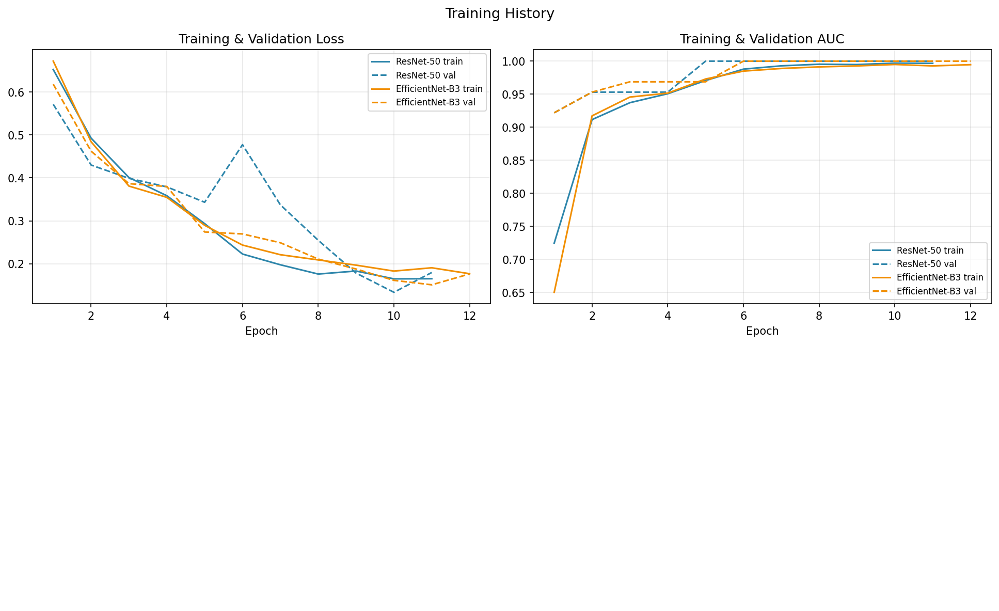

In [ ]:
hist_path = plot_training_history(histories, CFG["RESULTS_DIR"])
show_inline(hist_path)

In [ ]:
# ── 4. Test-set evaluation ────────────────────────────────────────────────
all_metrics  = {}
models_info  = []     # (model, target_layer) pairs for XAI

for mname, model in trained.items():
        label = model.model_label
        print(f"\n{'═'*60}\n  Evaluating {label}\n{'═'*60}")

        labels, preds, probs = collect_predictions(model, loaders["test"])
        metrics = compute_metrics(labels, preds, probs)
        all_metrics[label]   = metrics
        print_metrics(label, metrics)



════════════════════════════════════════════════════════════
  Evaluating ResNet-50
════════════════════════════════════════════════════════════


  inference:   0%|          | 0/20 [00:00<?, ?it/s]


  ────────────────────────────────────────
  ResNet-50 — Test-Set Metrics
  ────────────────────────────────────────
  accuracy     █████████████████░░░  0.8958
  precision    ██████████████████░░  0.9452
  recall       █████████████████░░░  0.8846
  f1           ██████████████████░░  0.9139
  roc_auc      ███████████████████░  0.9634
  ────────────────────────────────────────

════════════════════════════════════════════════════════════
  Evaluating EfficientNet-B3
════════════════════════════════════════════════════════════


  inference:   0%|          | 0/20 [00:00<?, ?it/s]


  ────────────────────────────────────────
  EfficientNet-B3 — Test-Set Metrics
  ────────────────────────────────────────
  accuracy     ██████████████████░░  0.9071
  precision    ██████████████████░░  0.9346
  recall       ██████████████████░░  0.9154
  f1           ██████████████████░░  0.9249
  roc_auc      ███████████████████░  0.9707
  ────────────────────────────────────────


  📊 CM + ROC → results/EfficientNetB3_cm_roc.png


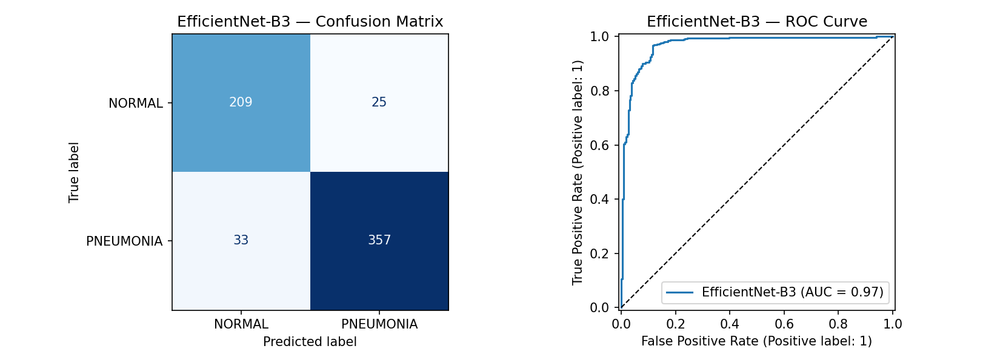

In [ ]:
 # Save metrics JSON
with open(os.path.join(CFG["RESULTS_DIR"], f"{mname}_metrics.json"), "w") as f:
       json.dump(metrics, f, indent=2)

        # Confusion matrix + ROC
cm_roc_path = plot_cm_roc(labels, preds, probs, label, CFG["RESULTS_DIR"])
show_inline(cm_roc_path)

tl = get_target_layer(model)
models_info.append((model, tl))


  📊 Metric comparison → results/metric_comparison.png


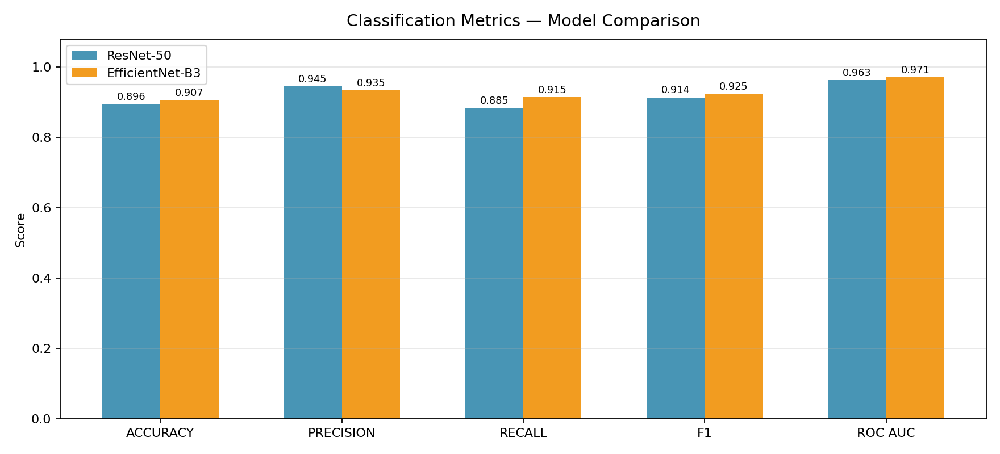

In [ ]:
 # ── 5. Metric comparison bar chart ────────────────────────────────────────
cmp_path = plot_metric_comparison(all_metrics, CFG["RESULTS_DIR"])
show_inline(cmp_path)


In [ ]:
try:
    from captum.attr import IntegratedGradients as CaptumIG
    CAPTUM_OK = True
except ImportError:
    CAPTUM_OK = False


════════════════════════════════════════════════════════════
  Generating XAI Visualisations
════════════════════════════════════════════════════════════


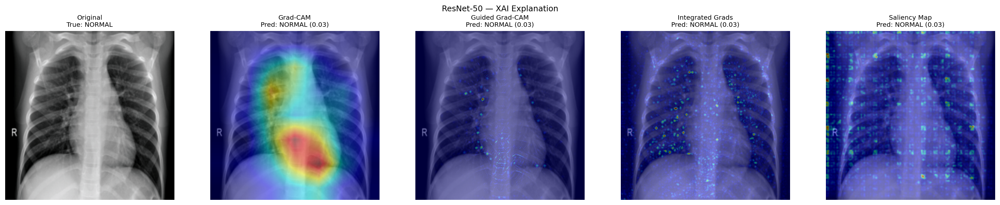

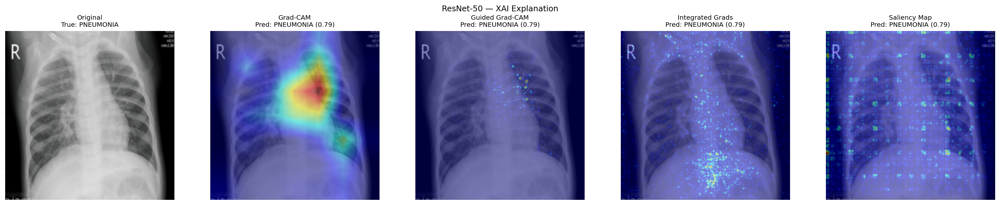

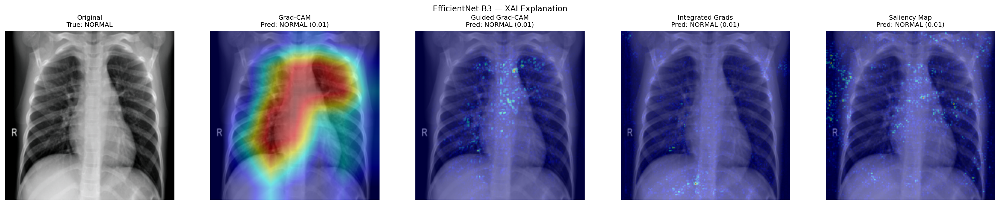

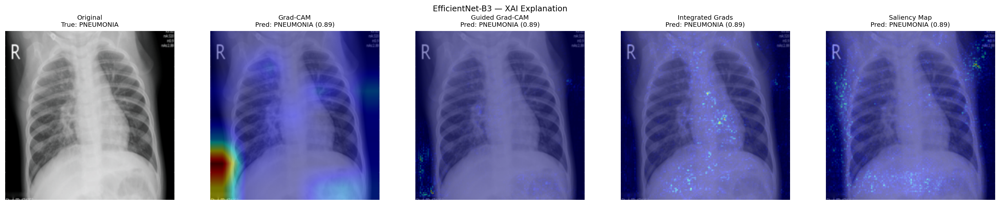

In [ ]:
# ── 6. Per-model XAI visualisations ──────────────────────────────────────
print(f"\n{'═'*60}\n  Generating XAI Visualisations\n{'═'*60}")

rng = np.random.default_rng(42)
sample_idx = rng.choice(
    len(test_ds),
    size=min(CFG["N_XAI_SAMPLES"], len(test_ds)),
    replace=False
)

for mname, model in trained.items():
    tl = get_target_layer(model)

    for i, idx in enumerate(sample_idx):
        img_t, label = test_ds[idx]
        out = os.path.join(
            CFG["RESULTS_DIR"],
            f"{mname}_xai_{i:03d}.png"
        )

        try:
            plot_xai_sample(model, tl, img_t, int(label), out)

            if i < 2:   # show first two inline
                show_inline(out)

        except Exception as e:
            print(f"  [WARN] {mname} sample {idx}: {e}")


════════════════════════════════════════════════════════════
  Cross-Model XAI Comparison
════════════════════════════════════════════════════════════


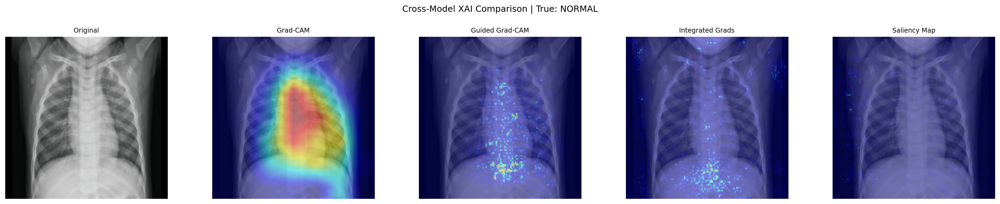

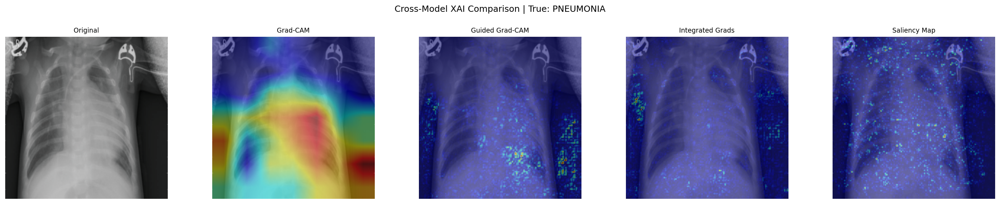

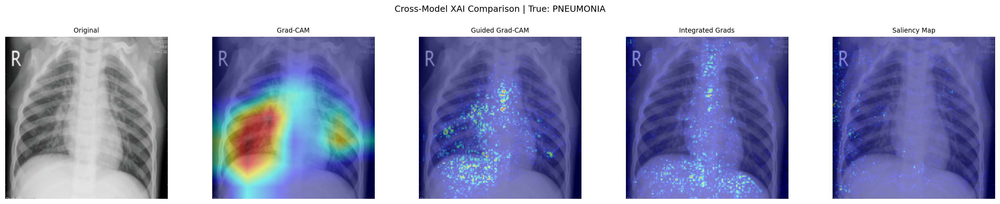

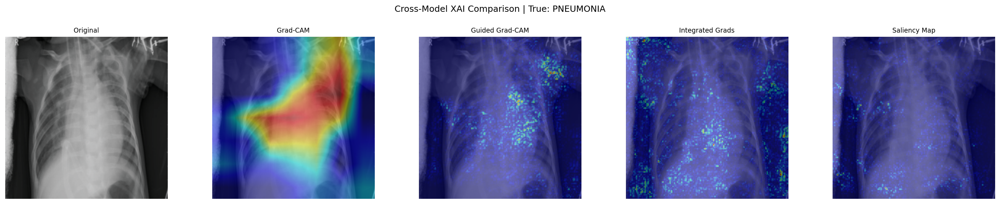

In [ ]:
# ── 7. Cross-model comparison grids ──────────────────────────────────────
print(f"\n{'═'*60}\n  Cross-Model XAI Comparison\n{'═'*60}")

cmp_idx = rng.choice(
    len(test_ds),
    size=min(CFG["N_COMPARE"], len(test_ds)),
    replace=False
)

for i, idx in enumerate(cmp_idx):
    img_t, label = test_ds[idx]
    out = os.path.join(
        CFG["RESULTS_DIR"],
        f"compare_grid_{i:03d}.png"
    )

    try:
        plot_comparison_grid(models_info, img_t, int(label), out)
        show_inline(out)
    except Exception as e:
        print(f"  [WARN] comparison grid {idx}: {e}")

In [ ]:
# ── 8. Explanation consistency score ──────────────────────────────────────
sample_imgs = [test_ds[i][0] for i in sample_idx[:10]]
consistency = explanation_consistency(models_info, sample_imgs)



  🔍 Explanation consistency (Grad-CAM, 8 images): 0.0000  (1.0 = identical, 0.0 = unrelated)


In [ ]:
# ── 9. Final summary ──────────────────────────────────────────────────────
print(f"\n{'═'*60}")
print("  FINAL SUMMARY")
print(f"{'═'*60}")

metric_keys = ["accuracy", "precision", "recall", "f1", "roc_auc"]

header = f"  {'Metric':<14}" + "".join(f"{n:<20}" for n in all_metrics)
print(header)

print("  " + "─" * (14 + 20 * len(all_metrics)))

for k in metric_keys:
    row = f"  {k:<14}" + "".join(f"{all_metrics[n][k]:<20.4f}" for n in all_metrics)
    print(row)

print(f"\n  Explanation Consistency (Grad-CAM): {consistency:.4f}")
print(f"\n  All outputs saved in: {CFG['RESULTS_DIR']}/")
print(f"{'═'*60}\n")


════════════════════════════════════════════════════════════
  FINAL SUMMARY
════════════════════════════════════════════════════════════
  Metric        ResNet-50           EfficientNet-B3     
  ──────────────────────────────────────────────────────
  accuracy      0.8958              0.9071              
  precision     0.9452              0.9346              
  recall        0.8846              0.9154              
  f1            0.9139              0.9249              
  roc_auc       0.9634              0.9707              

  Explanation Consistency (Grad-CAM): 0.0000

  All outputs saved in: results/
════════════════════════════════════════════════════════════



In [ ]:
DATA_ROOT = "chest_xray"
main(data_root=DATA_ROOT)


════════════════════════════════════════════════════════════
  XAI MEDICAL IMAGING PIPELINE
════════════════════════════════════════════════════════════
